In [1]:
import pandas as pd
import numpy as np
from tabula import read_pdf
import tabula

In [ ]:
box = [2.82,0.44,7.3,6.19]
box2 = [4.58]

In [ ]:
box = [2.82,0.44,7.3,6.19]
fc = 28.28
         
for i in range(0, len(box)):
    box[i] *= fc

In [ ]:
df = read_pdf('')

In [ ]:
df = read_pdf("97.pdf", pages=[1])



In [ ]:
pd.

In [ ]:
df = pd.read_json(df)

In [ ]:
import glob

In [ ]:
tabula.convert_into_by_batch("data", output_format='csv', pages='all')

In [ ]:
import dask.dataframe as dd
ddf = dd.read_csv(f"{'data'}/*.csv")

In [ ]:
ddf.compute(error_bad_lines=False)

In [ ]:
ddf.shape

In [ ]:
dd.DataFrame.to_csv(ddf, filename='copper_95-22')

In [ ]:
ddf.head(100)

In [ ]:
df = pd.read_csv('historic_prices.csv')

In [ ]:
df

In [2]:
prices = pd.read_csv('historic_prices.csv')

In [3]:
prices

,date,value
0,1959-07-02,0.2930
1,1959-07-06,0.2910
2,1959-07-07,0.2820
3,1959-07-08,0.2846
4,1959-07-09,0.2760
...,...,...
15845,2022-10-02,NaN
15846,2022-10-03,NaN
15847,2022-10-04,NaN
15848,2022-10-05,NaN


In [ ]:
df2 = pd.read_csv('total_vehicle_sales.csv')

In [ ]:
df2

In [ ]:
df2 = pd.read_csv('auto_production.csv')

In [ ]:
df.head(200)

## Prices

In [4]:
from prophet import Prophet

In [5]:
prices

,date,value
0,1959-07-02,0.2930
1,1959-07-06,0.2910
2,1959-07-07,0.2820
3,1959-07-08,0.2846
4,1959-07-09,0.2760
...,...,...
15845,2022-10-02,NaN
15846,2022-10-03,NaN
15847,2022-10-04,NaN
15848,2022-10-05,NaN


In [6]:
prices.isnull().value_counts()

date    value
False  False     15829
       True         21
dtype: int64

In [7]:
prices = prices.dropna()

In [8]:
prices = prices.rename(columns={'date':'ds', ' value':'y'})

In [9]:
prices = prices.rename(columns={'value':'y'})

In [10]:
m = Prophet()
m.fit(prices)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [18]:
# Python
future = m.make_future_dataframe(periods=3650)
future.tail()

,ds
19474,2032-09-08
19475,2032-09-09
19476,2032-09-10
19477,2032-09-11
19478,2032-09-12


In [19]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
19474,2032-09-08,3.280464,1.832689,4.820577
19475,2032-09-09,3.280338,1.778825,4.768872
19476,2032-09-10,3.280688,1.790497,4.736255
19477,2032-09-11,3.393846,1.916680,4.921803
19478,2032-09-12,4.475733,2.986308,5.964626


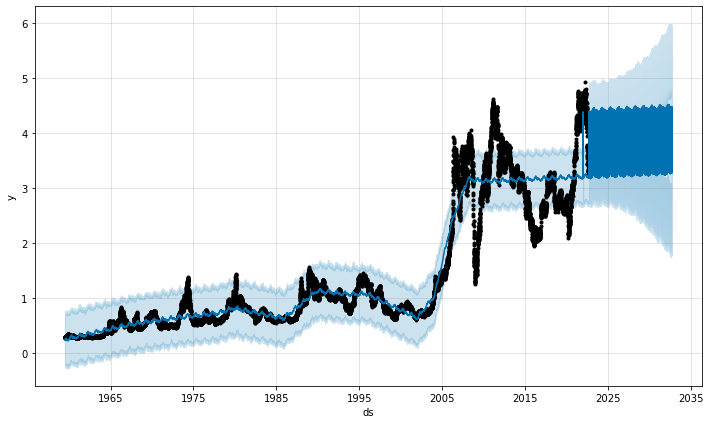

In [20]:
fig1 = m.plot(forecast)

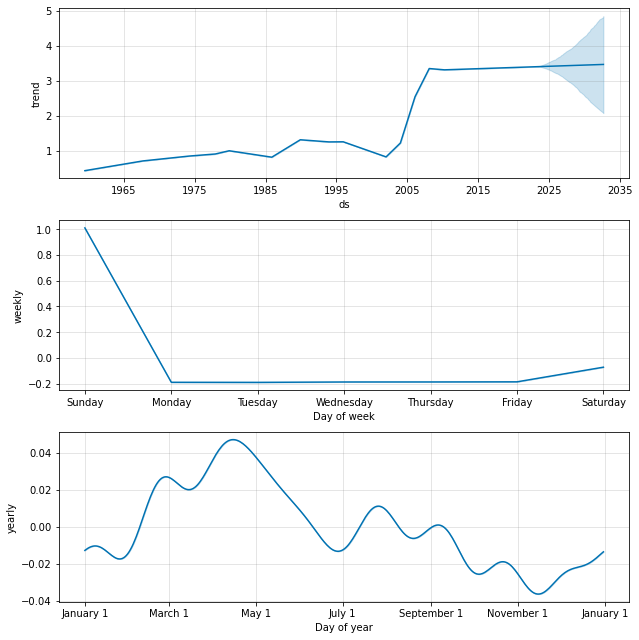

In [21]:
fig2 = m.plot_components(forecast)

In [22]:
from prophet.plot import plot_plotly, plot_components_plotly



In [23]:
plot_plotly(m, forecast)

In [24]:
plot_components_plotly(m, forecast)

# Scalecast

In [26]:
from scalecast.Forecaster import Forecaster
from pmdarima import auto_arima
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc={'figure.figsize':(14,7)})

In [41]:
df = pd.read_csv('copper.csv')


In [42]:
df.head()

,Unnamed: 0,year,prod_mine,refine_from_ore,refine_new_scrap,refine_old_scrap,import_ore,import_refined,export_ore,export_refined,consumption_refined,consumption_refined_plus_scrap
0,0,1995-01-01,1260,1040,40,146,14,813,237,94,1800,1860
1,1,1996-01-01,1220,1070,41,149,32,778,253,190,1820,1830
2,2,1997-01-01,1260,985,44,150,27,663,353,125,1830,1810
3,3,1998-01-01,1200,874,43,150,2,676,383,41,1710,1650
4,4,1999-01-01,1200,950,50,160,13,920,360,50,1800,2000


In [43]:
df = df.set_index(df.year)

In [28]:
df = df.apply(pd.to_numeric, errors='coerce')

In [44]:
cols=df.columns
df= df[cols].apply(pd.to_numeric, errors='coerce')

In [45]:
df.head()

,Unnamed: 0,year,prod_mine,refine_from_ore,refine_new_scrap,refine_old_scrap,import_ore,import_refined,export_ore,export_refined,consumption_refined,consumption_refined_plus_scrap
year,,,,,,,,,,,,
1995-01-01,0,NaN,1260,1040,40,146,14,813,237,94,1800,1860
1996-01-01,1,NaN,1220,1070,41,149,32,778,253,190,1820,1830
1997-01-01,2,NaN,1260,985,44,150,27,663,353,125,1830,1810
1998-01-01,3,NaN,1200,874,43,150,2,676,383,41,1710,1650
1999-01-01,4,NaN,1200,950,50,160,13,920,360,50,1800,2000


In [50]:
f = Forecaster(y=df['prod_mine'],current_dates=df.index)

In [51]:
f.generate_future_dates(12) # 12-month forecast horizon
f.set_test_length(.2) # 20% test set
f.set_estimator('arima') # set arima
f.manual_forecast(call_me='arima1') # forecast with arima

ValueError: No frequency information was provided with date index and no frequency could be inferred.